In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("Libs loaded.")

Libs loaded.


Napisz własną funkcję lub skrypt obliczający wartość progu globalnego wykorzystując poniższe metody. Narysuj histogram i zaznacz na nim wartość progową. Wyświetl obraz zbinaryzowany. Oblicz procentowy udział białych pikseli na obrazie binarnym. Porównaj działanie obydwu metod na tym samych obrazach. (0.3pkt)

1a. Maksymalizacja funkcji Jl (H. Niemann, Klassifikation von Mustern, Springer, Heidelberg, 1983):

![1a_equation](instruction_images/1a_equation.png)

Narysuj dla obrazów wykres funkcji Jl i znajdź wartość l maksymalizującą funkcję.

1b. Metoda Otsu (N. Otsu, A threshold selection method from gray-level histograms, IEEE Trans. Sys. Man. Cyber, 1979)

Algorytm oblicza wariancję międzyklasową, dla każdego dopuszczalnego poziomu jasności. Wartość progowa maksymalizuje funkcję wariancji międzyklasowej. Narysuj jak zmienia się wartość wariancji międzyklasowej w funkcji wartości progowej.

In [19]:
def binarize_image(image, threshold):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return binary_image

def calculate_histogram(image):
    histogram = np.histogram(image, bins=256, range=(0,256))[0]
    return histogram

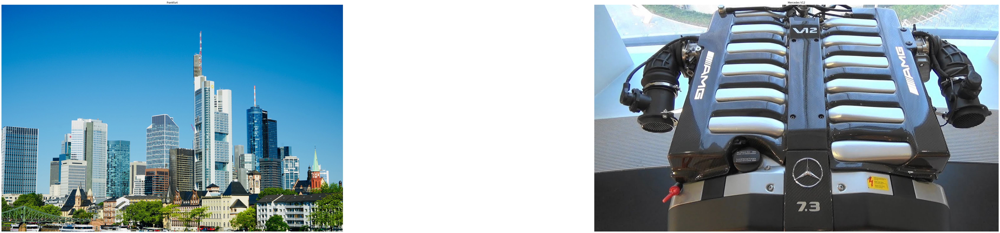

In [20]:
image_frankfurt_path = "images/frankfurt.jpg"
image_mercedes_v12_path = "images/mercedes_v12.jpg"

image_frankfurt = cv2.imread(image_frankfurt_path)
image_frankfurt = cv2.cvtColor(image_frankfurt, cv2.COLOR_BGR2RGB)

image_mercedes_v12 = cv2.imread(image_mercedes_v12_path)
image_mercedes_v12 = cv2.cvtColor(image_mercedes_v12, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(100, 20))

plt.subplot(1, 2, 1)
plt.imshow(image_frankfurt)
plt.title('Frankfurt')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_mercedes_v12)
plt.title('Mercedes V12')
plt.axis('off')

plt.show()

In [44]:
def nieman_method(image, histogram):
    total_pixels = image.size
    avg_brightness = np.sum(np.arange(256) * histogram) / total_pixels
    max_val = -np.inf
    optimal_threshold = -1
    Jl_values = []
    probability1_accumulative, brightness1_accumulative = 0, 0
    for l in range(256):
        probability1_accumulative += histogram[l]
        brightness1_accumulative += l * histogram[l]
        probability1 = probability1_accumulative / total_pixels
        probability2 = 1 - probability1
        if probability1_accumulative != 0:
            brightness1 = brightness1_accumulative / probability1_accumulative
        else:
            brightness1 = 0
        if total_pixels - probability1_accumulative != 0:
            brightness2 = (np.sum(np.arange(l, 256) * histogram[l:]) / (total_pixels - probability1_accumulative))
        else:
            brightness2 = 0
        Jl = probability1 * (brightness1 - avg_brightness) ** 2 + probability2 * (brightness2 - avg_brightness) ** 2
        Jl_values.append(Jl)
        if Jl > max_val:
            max_val = Jl
            optimal_threshold = l

    plt.figure(figsize=(8, 6))
    plt.plot(Jl_values, color='blue')
    plt.axvline(x=optimal_threshold, color='red', linestyle='--', label='Optimal Threshold')
    plt.title('Jl values for Nieman Method')
    plt.xlabel('Thresholds 0 - 255')
    plt.ylabel('Jl values (for each threshold)')
    plt.legend()
    plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.show()

    I = max_val

    print(f"Max value for Nieman: {I}")
    print(f"Optimal threshold: {optimal_threshold}")

    print("=========================================")

    return optimal_threshold

    plt.figure(figsize=(8, 6))
    plt.plot(Jl_values, color='blue')
    plt.axvline(x=optimal_threshold, color='red', linestyle='--', label='Optimal Threshold')
    plt.title('Jl values for Nieman Method')
    plt.xlabel('Thresholds 0 - 255')
    plt.ylabel('Jl values (for each threshold)')
    plt.legend()
    plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.show()

    I = max_val

    print(f"Max value for Nieman: {I}")
    print(f"Optimal threshold: {optimal_threshold}")

    print("=========================================")

    return optimal_threshold

In [45]:
def otsu_method(histogram):
    total_pixels = histogram.sum()
    histogram_normalized = histogram / total_pixels
    max_variance = 0
    optimal_threshold = 0
    variance_values = []

    for t in range(256):
        w0 = histogram_normalized[:t].sum()
        w1 = histogram_normalized[t:].sum()
        mu0 = (histogram_normalized[:t] * np.arange(t)).sum()
        mu1 = (histogram_normalized[t:] * np.arange(t, 256)).sum()
        variance = w0 * w1 * ((mu0 / w0 - mu1 / w1) ** 2)
        variance_values.append(variance)

        if variance > max_variance:
            max_variance = variance
            optimal_threshold = t

    plt.figure(figsize=(8, 6))
    plt.plot(variance_values, color='blue')
    plt.axvline(x=optimal_threshold, color='red', linestyle='--', label='Optimal Threshold')
    plt.title('Between Class Variance for Otsu Method')
    plt.xlabel('Thresholds 0 - 255')
    plt.ylabel('Between Class Variance')
    plt.legend()
    plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.show()

    print(f"Optimal threshold for Otsu method: {optimal_threshold}")

    print("=========================================")

    return optimal_threshold

In [46]:
def first_exercise_driver(file_path):
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    histogram = calculate_histogram(image)

    threshold_nieman = nieman_method(image, histogram)
    binary_image_nieman = binarize_image(image, threshold_nieman)

    threshold_otsu = otsu_method(histogram)
    binary_image_otsu = binarize_image(image, threshold_otsu)

    percentage_white_pixels_nieman = round((np.sum(image > threshold_nieman) / image.size) * 100)
    percentage_white_pixels_otsu = round((np.sum(image > threshold_otsu) / image.size) * 100)


    print(f"Value of threshold for Nieman method: {threshold_nieman}")
    print(f"Percentage of white pixels - Nieman: {percentage_white_pixels_nieman}%")
    print(f"Value of threshold for Otsu method: {threshold_otsu}")
    print(f"Percentage of white pixels - Otsu: {percentage_white_pixels_otsu}%")

    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(histogram, color='b')
    ax.axvline(x=threshold_nieman, color='fuchsia', linestyle='-.', label='Nieman')
    ax.axvline(x=threshold_otsu, color='darkviolet', linestyle='-.', label='Otsu')
    ax.set_title('Histogram with Threshold Values')
    ax.set_xlabel('Pixel Brightness')
    ax.set_ylabel('Number of pixels')
    ax.legend()
    ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

    plt.figure(figsize=(12, 4))
    plt.subplot(121)
    plt.imshow(binary_image_nieman, cmap='gray')
    plt.title('Binarized Image - Nieman')

    plt.subplot(122)
    plt.imshow(binary_image_otsu, cmap='gray')
    plt.title('Binarized Image - Otsu Method')

    plt.show()

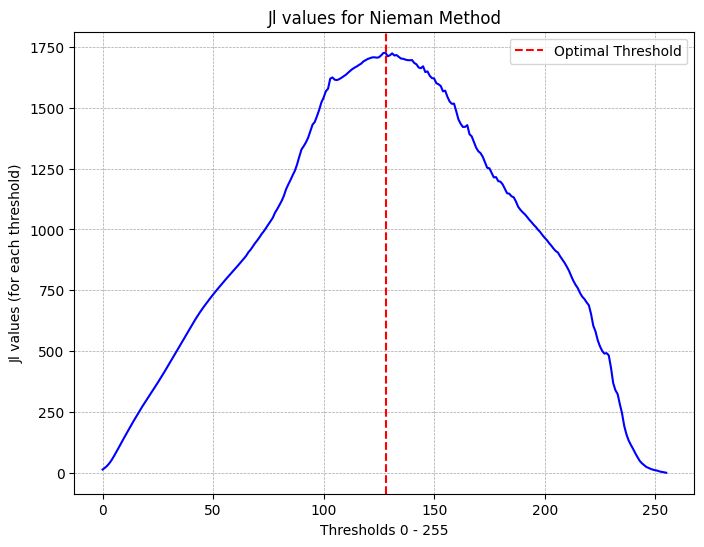

Max value for Nieman: 1726.6501604830469
Optimal threshold: 128


C:\Users\szymo\AppData\Local\Temp\ipykernel_11484\2253721344.py:13: RuntimeWarning: invalid value encountered in scalar divide
  variance = w0 * w1 * ((mu0 / w0 - mu1 / w1) ** 2)


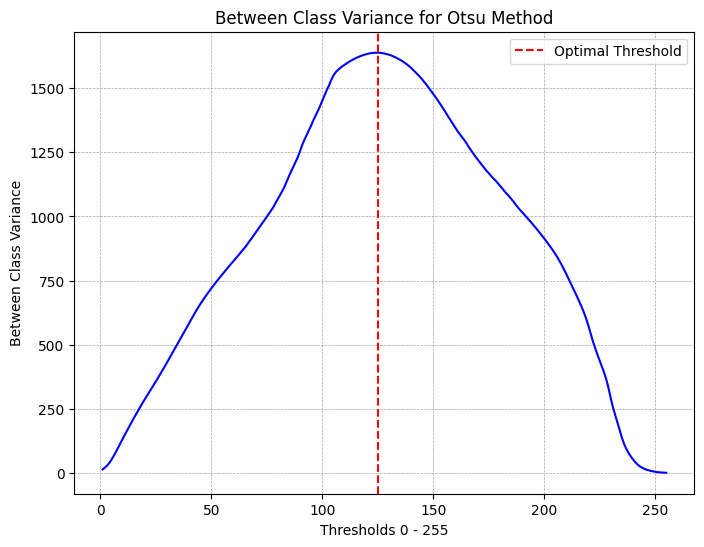

Optimal threshold for Otsu method: 125
Value of threshold for Nieman method: 128
Percentage of white pixels - Nieman: 43%
Value of threshold for Otsu method: 125
Percentage of white pixels - Otsu: 46%


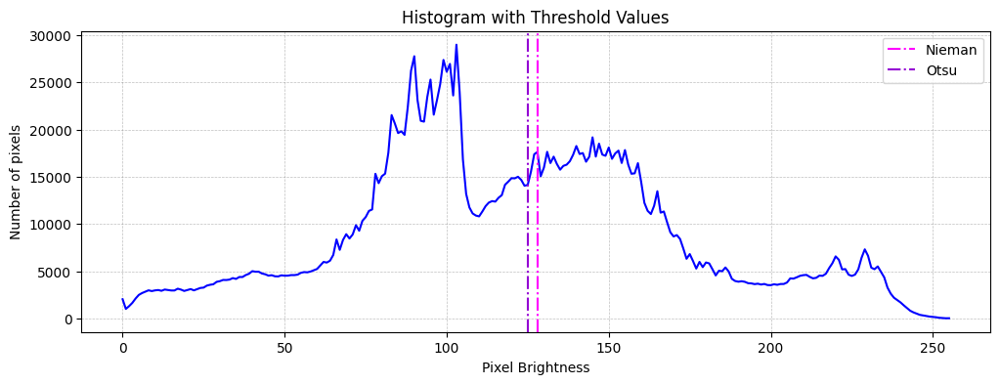

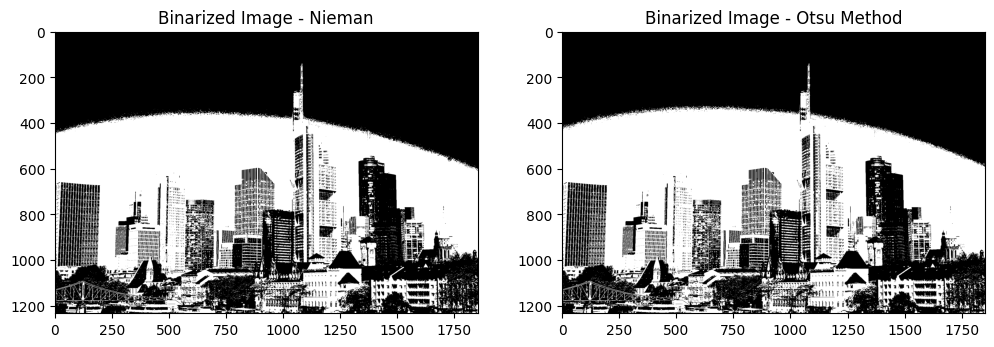

In [47]:
first_exercise_driver(file_path=image_frankfurt_path)

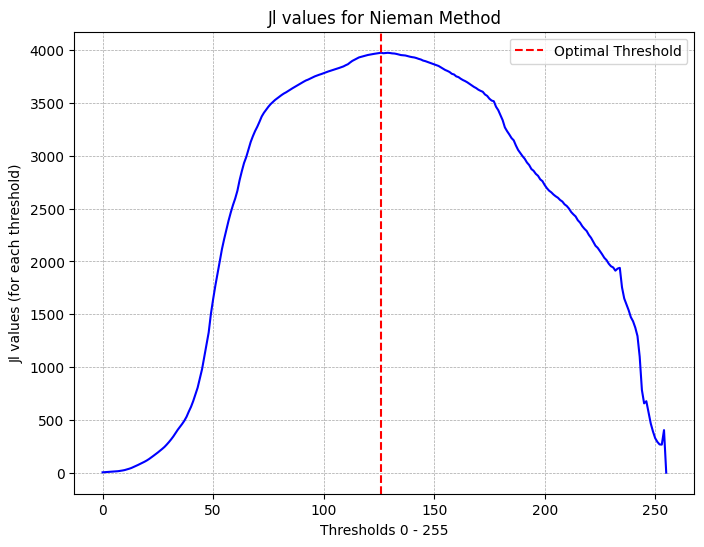

Max value for Nieman: 3975.0213565341287
Optimal threshold: 126


C:\Users\szymo\AppData\Local\Temp\ipykernel_11484\2253721344.py:13: RuntimeWarning: invalid value encountered in scalar divide
  variance = w0 * w1 * ((mu0 / w0 - mu1 / w1) ** 2)


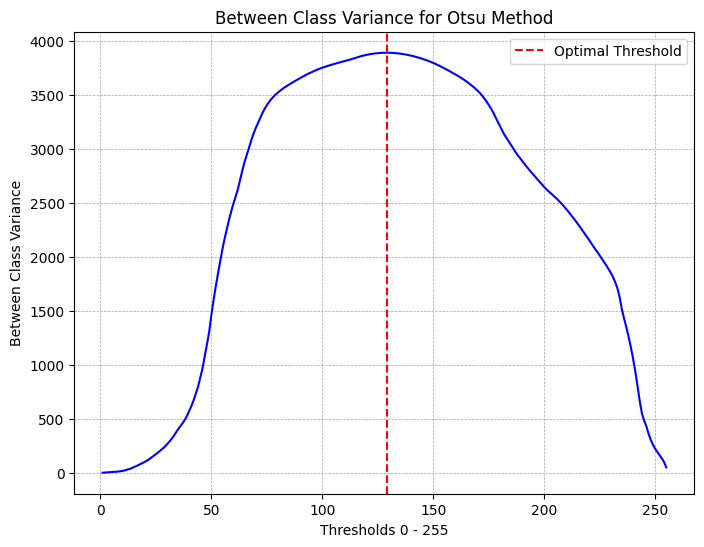

Optimal threshold for Otsu method: 129
Value of threshold for Nieman method: 126
Percentage of white pixels - Nieman: 42%
Value of threshold for Otsu method: 129
Percentage of white pixels - Otsu: 40%


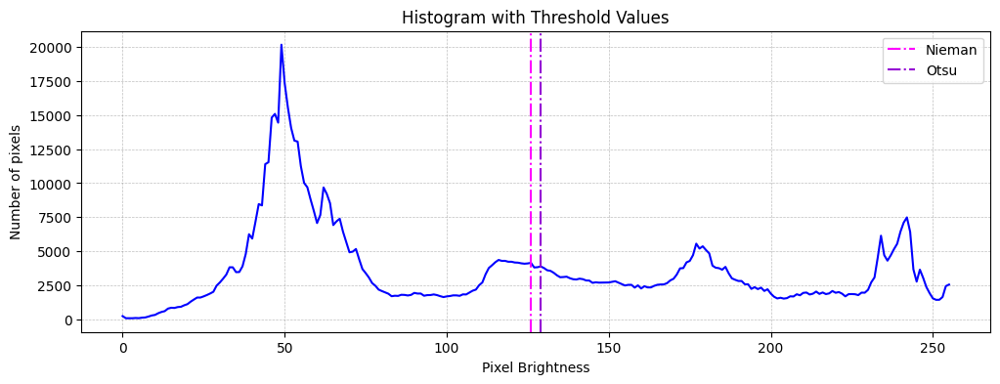

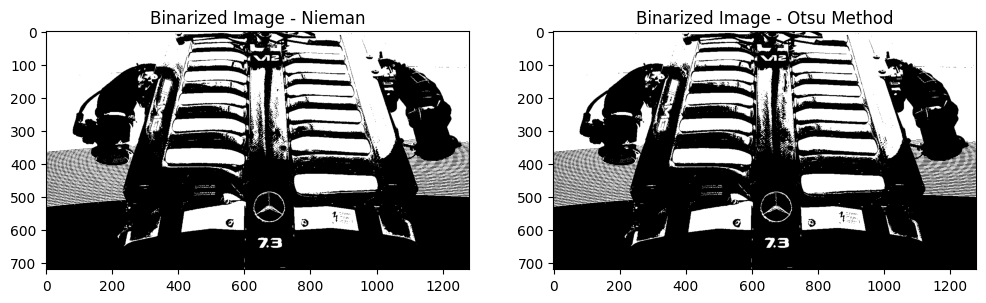

In [48]:
first_exercise_driver(file_path=image_mercedes_v12_path)

Opis i wnioski:
Różnice w obu metodach są znikome. Mimo różnych metrych i różnych zjawisk jakie przedstawiają wykresy funkcji Jl oraz wykresy wartość wariancji międzyklasowej,
ich kształty są zbliżone, ich celem jest wskazanie tej samej metryki, czyli wartości progowej. W obu przypadkach wyszły podobne wartości. Co skutkuje praktycznie identycznymi wynikami binaryzacji obrazów.
Natomiast z zasady metoda Otsu działający na zasadzie klasteryzacji grup pikseli o zbliżonych jasnościach uzyskanych przy pomocy klasteryzacji na podstawie danych reguł (np. klasteryzacja K-Mean), z reguły lepiej działa w przypadku dobrze wyseparowanych klas pikseli, np w wypadku wyraźnie różnego tła zdjęcia w stosunku do dalszego planu.
Zaś metoda Niemana lepiej będzie sprawować się w sytuacji bardziej skomplikowanych histogramów, jest ona napewno dokładniejsza, natomiast z uwagi na charakter przebiegu metodologi, czyli analizy funkcji kryterialnej, maksymalizacji, wymaga znacznie większych nakładów zasobów sprzętowych, bądź wysokiego stopnia optymalizacji kodu.

2. Napisz własną funkcję skrypt filtrujący obraz dwoma poniższymi filtrami dolnoprzepustowymi. Uwzględnij jedną z metod filtrowania pikseli na granicy obrazu.

![filters](instruction_images/filters.png)

Zbuduj analogiczne filtry uśredniające nxn o wymiarach n = 5 i 9. Porównaj działanie obydwu filtrów na tych samych obrazach. Dla filtrowanych obrazów wykonaj progowanie, w celu uzyskania obrazu binarnego. Porównaj obrazy binarne z otrzymanymi w punkcie 1. i obrazy binaryzowane po filtrowaniu (0.3pkt)

In [26]:
def filter_image(image, kernel):
    height, weight = image.shape
    kernel_size = kernel.shape[0]
    pad_size = kernel_size // 2
    output_image = np.zeros((height, weight), dtype=np.uint8)
    padded_image= np.pad(image, ((pad_size, pad_size), (pad_size, pad_size)), mode='constant')
    for i in range(height):
        for j in range(weight):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size]
            output_image[i, j] = np.sum(neighborhood * kernel)
    return output_image

def otsu_method(image):
    _, thresholded_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return thresholded_image

In [27]:
def display_images_with_labels(image, label):
    plt.imshow(image, cmap='gray')
    plt.title(label)
    plt.axis('off')
    plt.show()

def second_exercise_driver(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    kernel_1 = np.ones((3, 3), dtype=np.float32) / 9
    kernel_2 = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], dtype=np.float32) / 16
    kernel_5x5 = np.ones((5, 5), dtype=np.float32) / 25
    kernel_9x9 = np.ones((9, 9), dtype=np.float32) / 81

    image_filter_k1 = filter_image(image, kernel_1)
    image_filter_k2 = filter_image(image, kernel_2)
    image_filter_5x5 = filter_image(image, kernel_5x5)
    image_filter_9x9 = filter_image(image, kernel_9x9)

    image_binary = otsu_method(image)
    image_binary_filter_k1 = otsu_method(image_filter_k1)
    image_binary_filter_k2 = otsu_method(image_filter_k2)
    image_binary_filter_5x5 = otsu_method(image_filter_5x5)
    image_binary_filter_9x9 = otsu_method(image_filter_9x9)

    images = [image, image_filter_k1, image_filter_k2, image_filter_5x5, image_filter_9x9, image_binary, image_binary_filter_k1, image_binary_filter_k2, image_binary_filter_5x5, image_binary_filter_9x9]
    labels = ['image', 'image_filter_k1 1', 'image_filter_k2 2', 'image_filter_5x5', ' image_filter_9x9', 'image_binary', 'image_binary_filter_k1', 'image_binary_filter_k2', 'image_binary_filter_5x5', 'image_binary_filter_9x9']

    for i in range(len(images)):
        display_images_with_labels(images[i], labels[i])

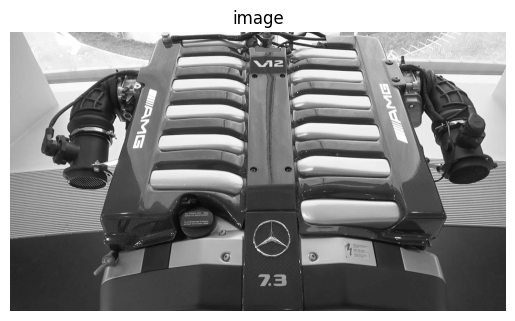

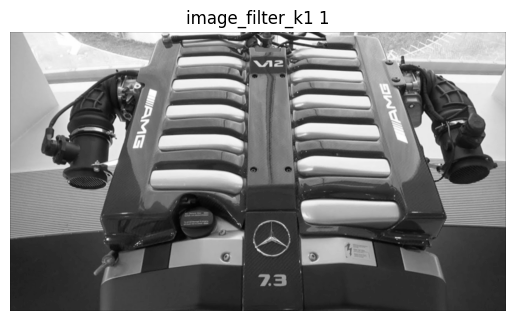

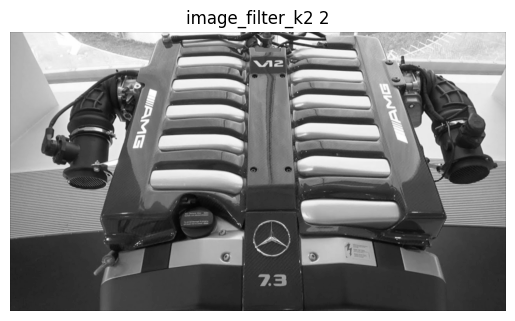

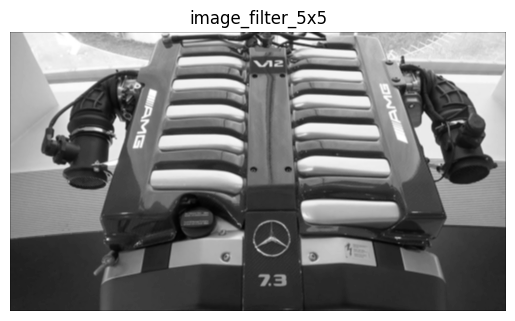

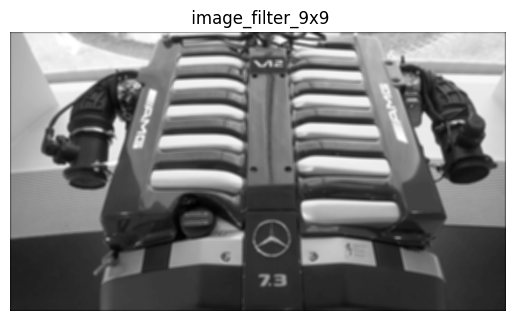

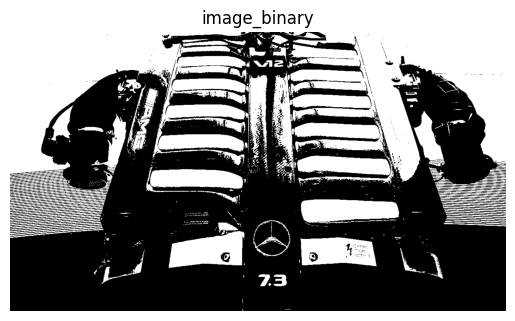

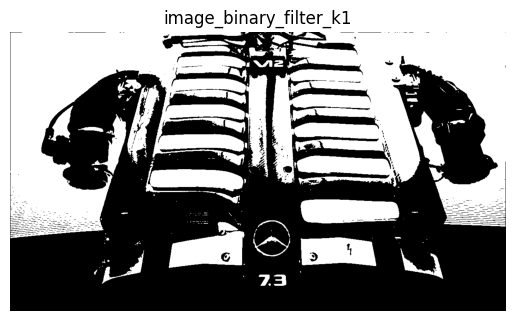

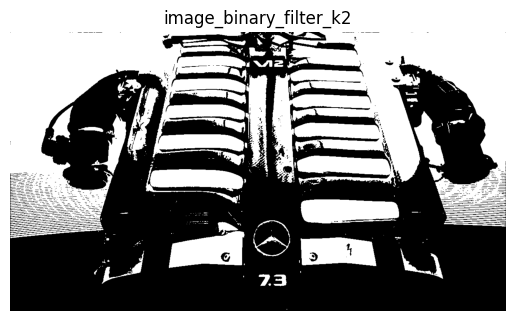

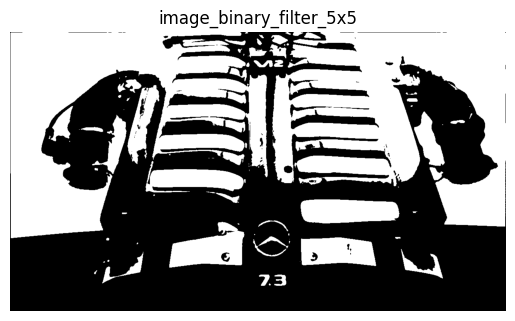

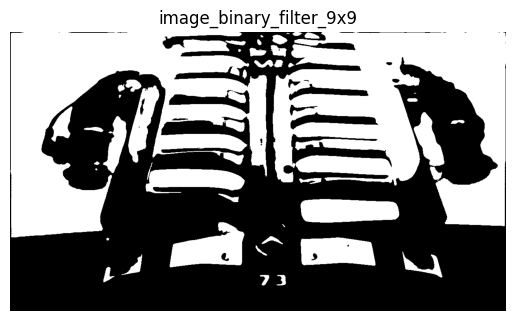

In [28]:
second_exercise_driver(image_path=image_mercedes_v12_path)

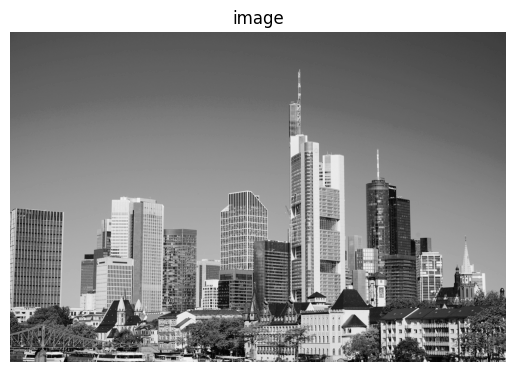

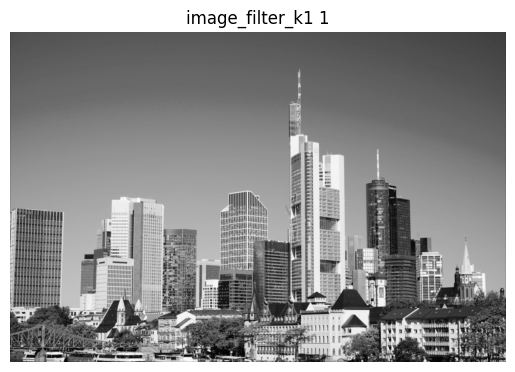

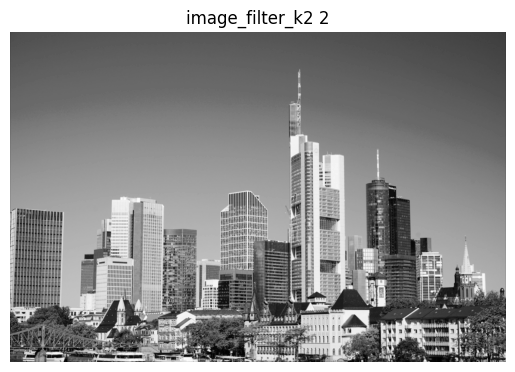

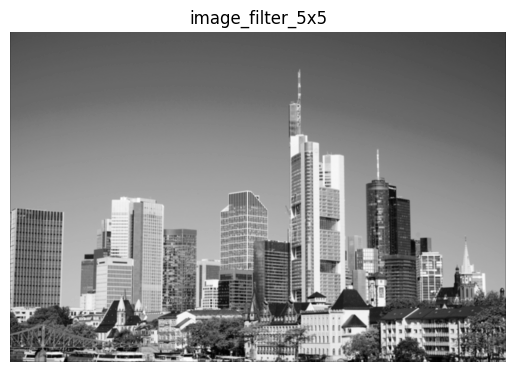

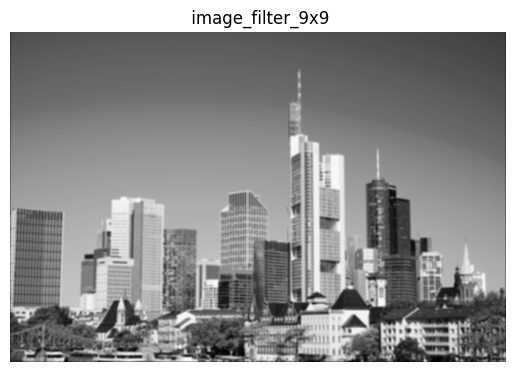

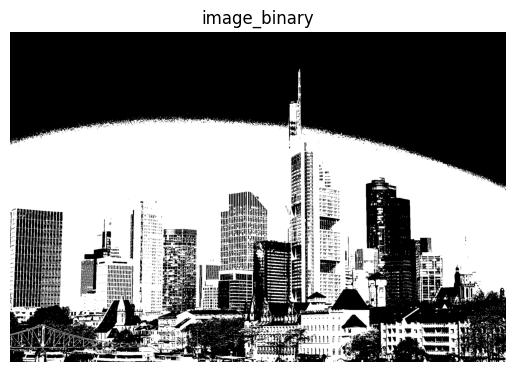

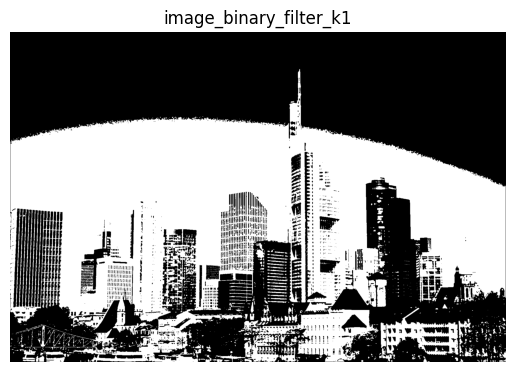

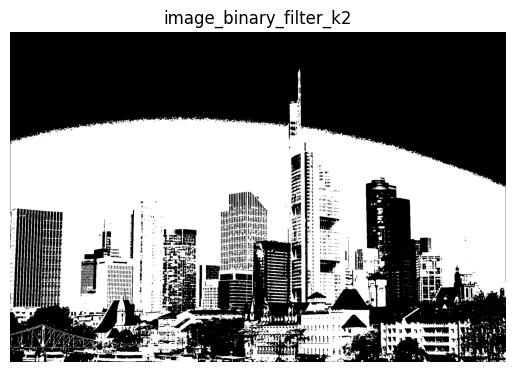

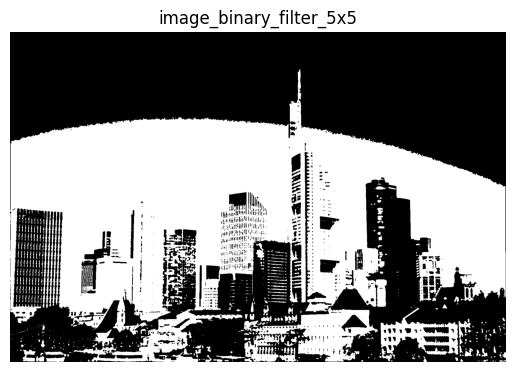

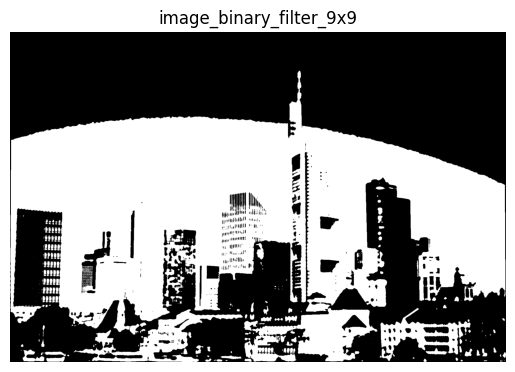

In [29]:
second_exercise_driver(image_path=image_frankfurt_path)

Opis i wnioski:
Im większe wartości kerneli tym większe następuje rozmycie obrazu, co jest spowodowane faktem, że większe filtry obejmują większe obszary pikseli, co skutkuje większym uśrednieniem wartości pikseli w danym obszarze - wynika to wprost z definicji konwolucji stosowanych w sieciach neuronowych splotowych właśnie w kontekście analizy, rozpoznawnia i przetwarzaniu informacji w formatach zdjęć lub wideo. Prowadzi to do utraty szczegółów, jednakże niekiedy na potrzeby konkretnych operacji analizy może być to porządany efekt. Jest to efektem zarówno w przypadku zdjęć w skali szarości jak i obrazów binarnych - zwłaszcza w przypadku obrazów binarnych widoczne są dość drastycznie zanikające tekstury szczegółów, np budynków widoczne na zdjęciu panoramy miasta Frankfurt.

3. Wykorzystaj dwie postaci filtra Laplace’a do wyostrzenia obrazu:

![filter2](instruction_images/filter2.png)

Porównaj działanie obydwu filtrów dla wybranych obrazów (0.2pkt)

In [30]:
image_san_fran_bridge_path = "images/san_fran_bridge.jpg"
image_london_bridge_path = "images/london_bridge.jpg"

In [31]:
def Laplace_filter(image_path, kernel1, kernel2, name):
    image = cv2.imread(image_path, 0)  # read only shades of gray

    def apply_kernel(image, kernel):
        height, width = image.shape
        filtered_image = np.zeros_like(image, dtype=np.float32)
        for i in range(1, height - 1):
            for j in range(1, width - 1):
                filtered_image[i, j] = np.sum(image[i-1:i+2, j-1:j+2] * kernel)
        filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)
        return filtered_image

    filtered_image1 = apply_kernel(image, kernel1)
    filtered_image2 = apply_kernel(image, kernel2)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1), plt.imshow(image, cmap='gray')
    plt.title(f'{name}'), plt.xticks([]), plt.yticks([])

    plt.subplot(1, 3, 2), plt.imshow(filtered_image1, cmap='gray')
    plt.title(f'{name} - kernel1'), plt.xticks([]), plt.yticks([])

    plt.subplot(1, 3, 3), plt.imshow(filtered_image2, cmap='gray')
    plt.title(f'{name} - kernel2'), plt.xticks([]), plt.yticks([])

    plt.show()

In [32]:
kernel1 = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
kernel2 = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])

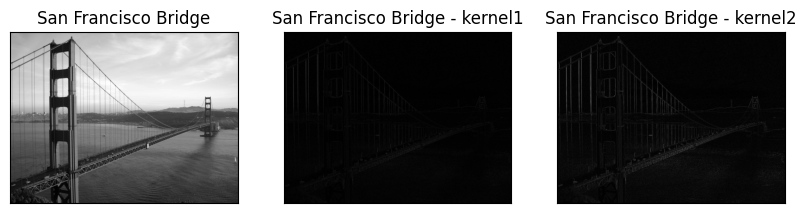

In [33]:
Laplace_filter(image_path=image_san_fran_bridge_path, kernel1=kernel1, kernel2=kernel2, name="San Francisco Bridge")

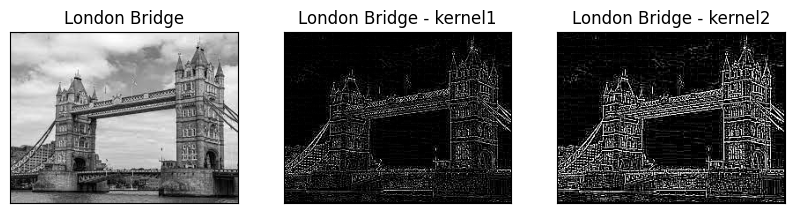

In [34]:
Laplace_filter(image_path=image_london_bridge_path, kernel1=kernel1, kernel2=kernel2, name="London Bridge")

Opis i wyniki:
Filtr Laplacea jest jednym z najbardziej popularnych filtrów do detekcji krawędzi obiektów w kontekście	przetwarzania obrazów, poprzez zwiększanie kontrastu w okolicy
położenia krawędzi.
Widoczne są również istotne różnice w zastosowanych kernelach, bowiem kernel2 dziala znacznie lepiej z uwagi na wykrywanie krawędzi w różnych kierunkach, co jest spowodowane wartościami wag dla operacji stosowanych na diagonalach danego kernela w przeciwieństwie do kernela1 który posiada 0 na diagonalach. Wagi te zostały dobrane empirycznie przez smaego Laplace bodajże. I im większa różnica bezwzględna między wartością piksela centralnego, a wartościami pikseli otaczających, tym większa zmienność wartości wag pikseli, co z kolei wskazywać może na obecność krawędzi.
Korzysta z operatora Laplace'a, który jest operatorem różniczkowym drugiego rzędu, stąd jego nazwa.

4. Napisz własną funkcję lub skrypt filtrujący obraz filtrem medianowym. Przetestuj działanie filtra na obrazach z szumem typu „salt and pepper” (0.2pkt)

In [35]:
image_owl_path = "images/owl.jpg"
image_people_with_ballons_path = "images/people_with_ballons.png"

In [36]:
def median_filter(image_path, kernel_size, name):
    img = cv2.imread(image_path)
    pad_size = kernel_size // 2
    padded_img = np.pad(img, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='constant')
    height, width, _ = img.shape
    result = np.zeros((height, width, 3), dtype=np.uint8)
    for i in range(height):
        for j in range(width):
            for k in range(3):
                neighborhood = padded_img[i:i+kernel_size, j:j+kernel_size, k]
                result[i, j, k] = np.median(neighborhood)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title(f'Original Image - {name}')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2)
    plt.title(f'Median Filtered Image - {name}')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.show()

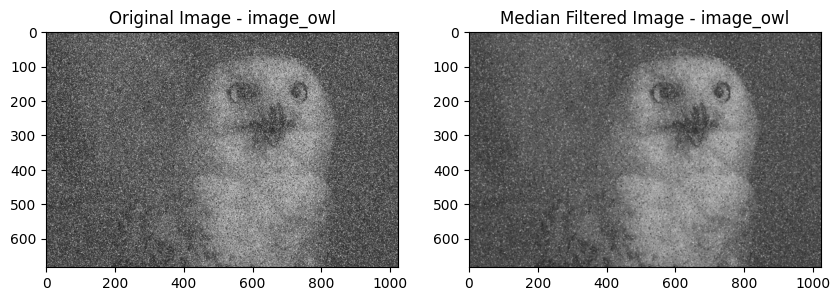

In [37]:
median_filter(image_path=image_owl_path, kernel_size=3, name="image_owl")

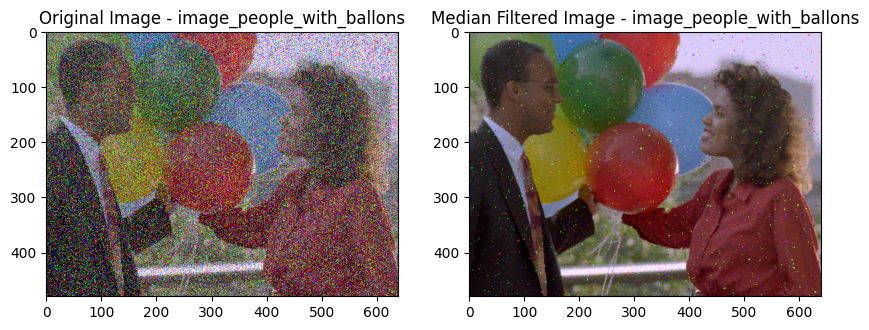

In [38]:
median_filter(image_path=image_people_with_ballons_path, kernel_size=3, name="image_people_with_ballons")

Opis i wyniki:
W moim przypadku wybrałem zarówno obraz czarno-biały (o jednym kanale) oraz kolorowy (o trzech kanałach). Dla obrazów kolorowych filtr medianowy działa na każdym kanale koloru niezależnie, co pozwala na usunięcie szumu z każdego kanału. W przypadku obrazów w skali szarości filtr medianowy działa na pojedynczym kanale.
Działa on bodajże wedle zasady: dla każdego kanału koloru obliczana jest mediana wartości pikseli w danym sąsiedztwie. Mediana jest wartością środkową, która jest wybierana z uporządkowanego ciągu wartości pikseli. Jest to operacja nieliniowa (tj. wartość piksela wynikowego obrazu nie jest liniową kombinacją, funkcją wartości pikseli w jego sąsiedztwie), która pomaga w redukcji szumu, takiego jak sól i pieprz, poprzez odfiltrowanie wartości skrajnych. Kolejno wartości piksela centralnego przez medianę wartości pikseli w określonym sąsiedztwie.
W obu przypadkach filtr działa poprawnie i uzyskuje bardzo dobre wyniki (jest to widoczne bez konieczności stosowania dodatkowych metryk).